Requires pytorch '0.4.1' and python 3

MIT License

Copyright (c) 2018 Udacity

Permission is hereby granted, free of charge, to any person obtaining a copy
of this software and associated documentation files (the "Software"), to deal
in the Software without restriction, including without limitation the rights
to use, copy, modify, merge, publish, distribute, sublicense, and/or sell
copies of the Software, and to permit persons to whom the Software is
furnished to do so, subject to the following conditions:

The above copyright notice and this permission notice shall be included in all
copies or substantial portions of the Software.

THE SOFTWARE IS PROVIDED "AS IS", WITHOUT WARRANTY OF ANY KIND, EXPRESS OR
IMPLIED, INCLUDING BUT NOT LIMITED TO THE WARRANTIES OF MERCHANTABILITY,
FITNESS FOR A PARTICULAR PURPOSE AND NONINFRINGEMENT. IN NO EVENT SHALL THE
AUTHORS OR COPYRIGHT HOLDERS BE LIABLE FOR ANY CLAIM, DAMAGES OR OTHER
LIABILITY, WHETHER IN AN ACTION OF CONTRACT, TORT OR OTHERWISE, ARISING FROM,
OUT OF OR IN CONNECTION WITH THE SOFTWARE OR THE USE OR OTHER DEALINGS IN THE
SOFTWARE.


# Style Transfer with Deep Neural Networks


In this notebook, we’ll *recreate* a style transfer method that is outlined in the paper, [Image Style Transfer Using Convolutional Neural Networks, by Gatys](https://www.cv-foundation.org/openaccess/content_cvpr_2016/papers/Gatys_Image_Style_Transfer_CVPR_2016_paper.pdf) in PyTorch.

In this paper, style transfer uses the features found in the 19-layer VGG Network, which is comprised of a series of convolutional and pooling layers, and a few fully-connected layers. In the image below, the convolutional layers are named by stack and their order in the stack. Conv_1_1 is the first convolutional layer that an image is passed through, in the first stack. Conv_2_1 is the first convolutional layer in the *second* stack. The deepest convolutional layer in the network is conv_5_4.

<img src='vgg19_convlayers.png' width=80% />

### Separating Style and Content

Style transfer relies on separating the content and style of an image. Given one content image and one style image, we aim to create a new, _target_ image which should contain our desired content and style components:
* objects and their arrangement are similar to that of the **content image**
* style, colors, and textures are similar to that of the **style image**

An example is shown below, where the content image is of a cat, and the style image is of [Hokusai's Great Wave](https://en.wikipedia.org/wiki/The_Great_Wave_off_Kanagawa). The generated target image still contains the cat but is stylized with the waves, blue and beige colors, and block print textures of the style image!

<img src='style_tx_cat.png' width=80% />

In this notebook, we'll use a pre-trained VGG19 Net to extract content or style features from a passed in image. We'll then formalize the idea of content and style _losses_ and use those to iteratively update our target image until we get a result that we want. 

In [7]:
# import resources
%matplotlib inline

from PIL import Image
import matplotlib.pyplot as plt
import numpy as np

import torch
import torch.optim as optim
from torchvision import transforms, models
import cv2

In [2]:
torch.__version__

'0.4.1'

## Load in VGG19 (features)

VGG19 is split into two portions:
* `vgg19.features`, which are all the convolutional and pooling layers
* `vgg19.classifier`, which are the three linear, classifier layers at the end

We only need the `features` portion, which we're going to load in and "freeze" the weights of, below.

In [2]:
# get the "features" portion of VGG19 (we will not need the "classifier" portion)
vgg = models.vgg19(pretrained=True).features

# freeze all VGG parameters since we're only optimizing the target image
for param in vgg.parameters():
    param.requires_grad_(False)

In [3]:
# move the model to GPU, if available
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

vgg.to(device)

Sequential(
  (0): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (1): ReLU(inplace)
  (2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (3): ReLU(inplace)
  (4): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (5): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (6): ReLU(inplace)
  (7): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (8): ReLU(inplace)
  (9): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (10): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (11): ReLU(inplace)
  (12): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (13): ReLU(inplace)
  (14): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (15): ReLU(inplace)
  (16): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (17): ReLU(inplace)
  (18): MaxPool2d(kernel_size=2, stride=2, padding=0, 

### Load in Content and Style Images

You can load in any images you want! Below, we've provided a helper function for loading in any type and size of image. The `load_image` function also converts images to normalized Tensors.

Additionally, it will be easier to have smaller images and to squish the content and style images so that they are of the same size.

In [4]:
def load_image(image, max_size=400, shape=None):
    ''' Load in and transform an image, making sure the image
       is <= 400 pixels in the x-y dims.'''
    
    #image = Image.open(img_path).convert('RGB')
    
    # large images will slow down processing
    #if max(image.size) > max_size:
    #    size = max_size
    #else:
    #    size = max(image.size)
    
    if shape is not None:
        size = shape
        
        in_transform = transforms.Compose([
                            transforms.Resize(size),
                            transforms.ToTensor(),
                            transforms.Normalize((0.485, 0.456, 0.406), 
                                                 (0.229, 0.224, 0.225))])
    else:
        in_transform = transforms.Compose([
                            #transforms.Resize(size),
                            transforms.ToTensor(),
                            transforms.Normalize((0.485, 0.456, 0.406), 
                                                 (0.229, 0.224, 0.225))])
        

    # discard the transparent, alpha channel (that's the :3) and add the batch dimension
    image = in_transform(image)[:3,:,:].unsqueeze(0)
    
    return image

Next, I'm loading in images by file name and forcing the style image to be the same size as the content image.

In [5]:
image = Image.open('ramesh_960x540.png').convert('RGB')

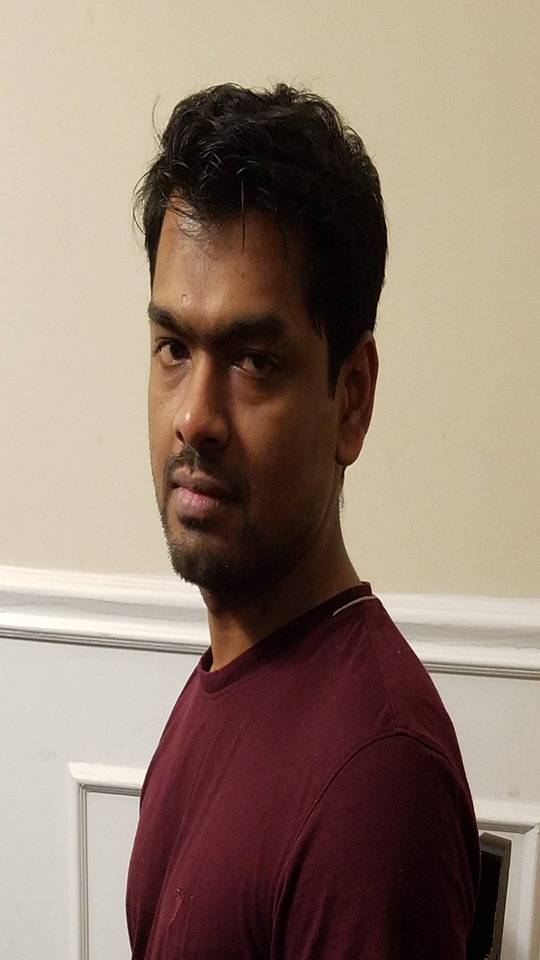

In [7]:
image

In [8]:
#zero-parameter, automatic Canny edge detection 
#https://www.pyimagesearch.com/2015/04/06/zero-parameter-automatic-canny-edge-detection-with-python-and-opencv/
#lets see if we can get the outline and then apply some strokes with style transfer
import cv2
image = cv2.imread('ramesh_960x540.png')
gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
blurred = cv2.GaussianBlur(gray, (3, 3), 0)
# compute the median of the single channel pixel intensities
v = np.median(blurred)
sigma = 0.33
# apply automatic Canny edge detection using the computed median
lower = int(max(0, (1.0 - sigma) * v))
upper = int(min(255, (1.0 + sigma) * v))
edged = cv2.Canny(blurred, lower, upper)

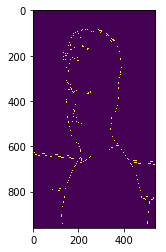

In [13]:
plt.imshow(edged) # this will not help much 

In [49]:
# load in content and style images. 
content_portrait = load_image(image).to(device)
#content_blank = load_image(content_blank).to(device)

In [22]:
content_portrait.shape

torch.Size([1, 3, 960, 540])

In [9]:
# Resize style to match content 
#style = Image.open('images/vangogh.jpg').convert('RGB')
#style = load_image(style, shape=content_portrait.shape[-2:]).to(device)

In [22]:
#Trying a different style image 
#style = Image.open('images/Van_Gogh2.jpg').convert('RGB')
#style = load_image(style, shape=content_portrait.shape[-2:]).to(device)

In [36]:
#style = Image.open('images/waterlilly.jpg').convert('RGB')
#style = load_image(style, shape=content_portrait.shape[-2:]).to(device)

In [61]:
style = Image.open('images/van-gogh-the-starry-night-1889.jpg').convert('RGB')
style = load_image(style, shape=content_portrait.shape[-2:]).to(device)

In [8]:
img_gray = cv2.cvtColor(cv2.imread('ramesh_960x540.png'), cv2.COLOR_RGB2GRAY)
img_blur = cv2.GaussianBlur(img_gray, (21, 21), 0, 0)
img_blend = cv2.divide(img_gray, img_blur, scale=256)

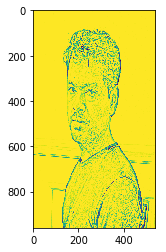

In [9]:
plt.imshow(img_blend)

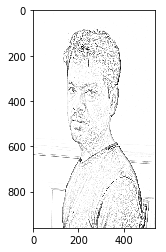

In [10]:
plt.imshow(cv2.cvtColor(img_blend, cv2.COLOR_GRAY2RGB))
bg_sketch = cv2.cvtColor(img_blend, cv2.COLOR_GRAY2RGB)

In [11]:
content_portrait = load_image(bg_sketch).to(device)

In [17]:
style.shape

torch.Size([1, 3, 960, 540])

In [33]:
# helper function for un-normalizing an image 
# and converting it from a Tensor image to a NumPy image for display
def im_convert(tensor):
    """ Display a tensor as an image. """
    
    image = tensor.to("cpu").clone().detach()
    image = image.numpy().squeeze()
    image = image.transpose(1,2,0)
    image = image * np.array((0.229, 0.224, 0.225)) + np.array((0.485, 0.456, 0.406))
    image = image.clip(0, 1)
    return image

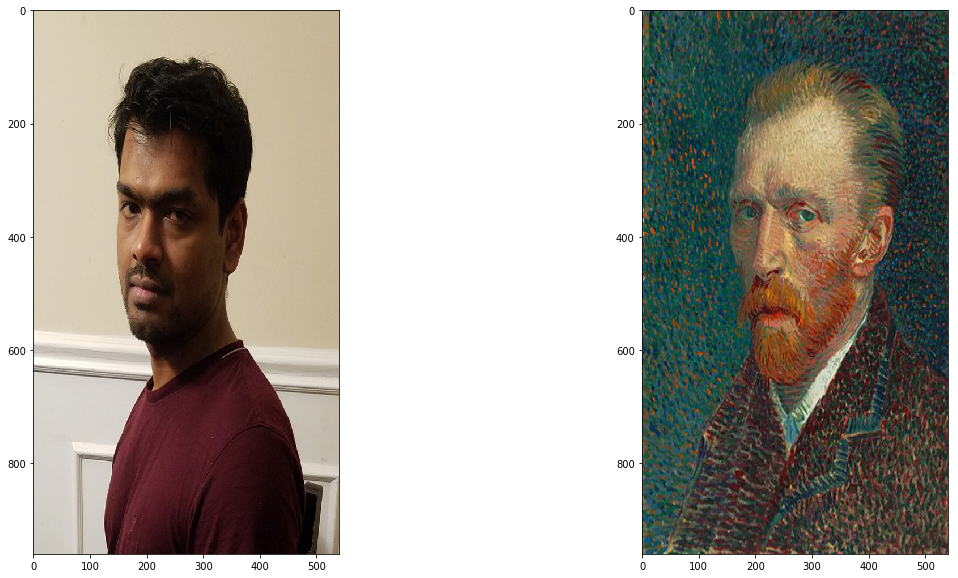

In [12]:
# display the images
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 10))
# content and style ims side-by-side
ax1.imshow(im_convert(content_portrait))
ax2.imshow(im_convert(style))

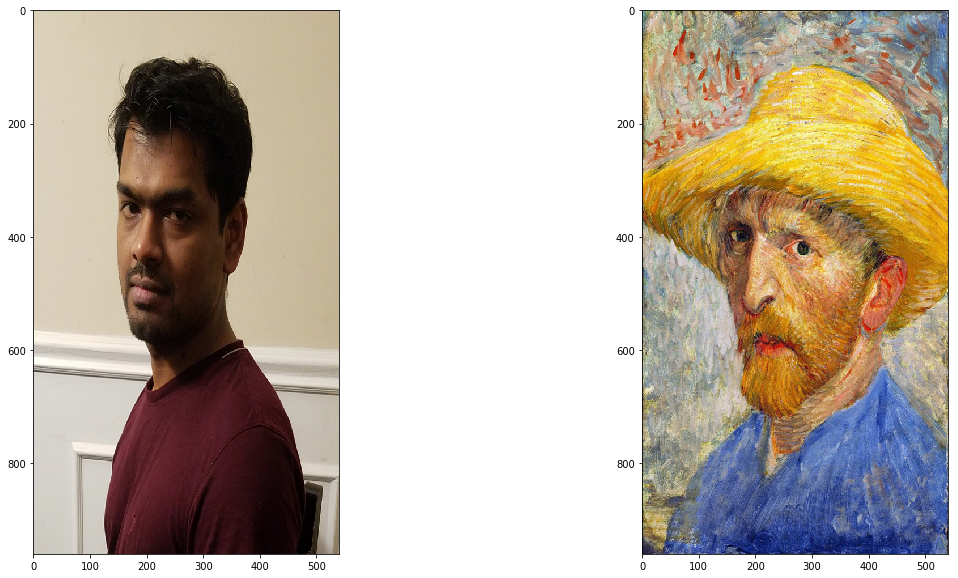

In [11]:
# display the images 
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 10))
# content and style ims side-by-side
ax1.imshow(im_convert(content_portrait))
ax2.imshow(im_convert(style))

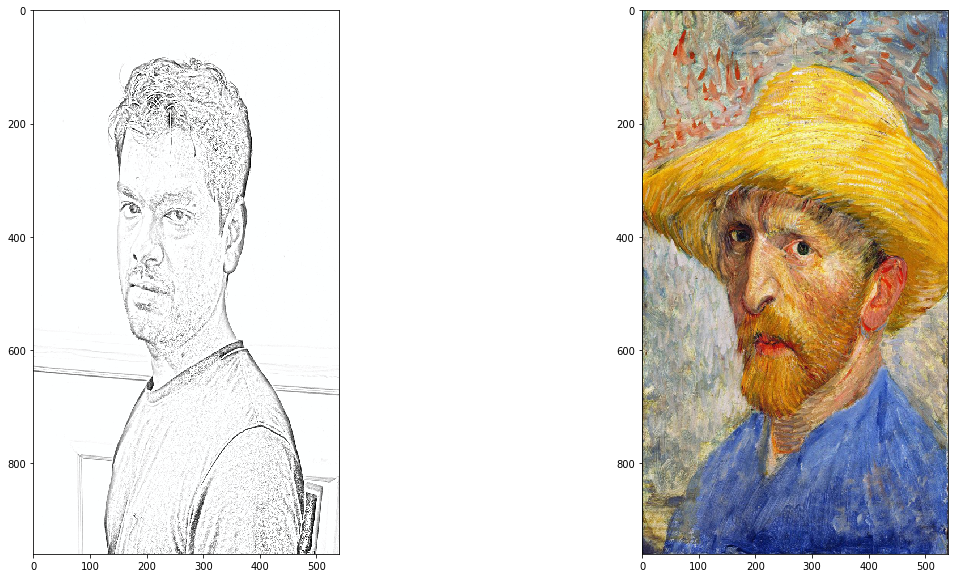

In [59]:
# display the images
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 10))
# content and style ims side-by-side
ax1.imshow(im_convert(content_portrait))
ax2.imshow(im_convert(style))

---
## VGG19 Layers

To get the content and style representations of an image, we have to pass an image forward throug the VGG19 network until we get to the desired layer(s) and then get the output from that layer.

In [ ]:
# print out VGG19 structure so you can see the names of various layers
# print(vgg)

## Content and Style Features

Below, complete the mapping of layer names to the names found in the paper for the _content representation_ and the _style representation_.

In [17]:
def get_features(image, model, layers=None):
    """ Run an image forward through a model and get the features for 
        a set of layers. Default layers are for VGGNet matching Gatys et al (2016)
    """
    
    ## TODO: Complete mapping layer names of PyTorch's VGGNet to names from the paper
    ## Need the layers for the content and style representations of an image
    if layers is None:
        layers = {'0': 'conv1_1',
                  '5': 'conv2_1', 
                  '10': 'conv3_1', 
                  '19': 'conv4_1',
                  '21': 'conv4_2',  ## content representation
                  '28': 'conv5_1'}
        
    features = {}
    x = image
    # model._modules is a dictionary holding each module in the model
    for name, layer in model._modules.items():
        x = layer(x)
        if name in layers:
            features[layers[name]] = x
            
    return features

---
## Gram Matrix 

The output of every convolutional layer is a Tensor with dimensions associated with the `batch_size`, a depth, `d` and some height and width (`h`, `w`). The Gram matrix of a convolutional layer can be calculated as follows:
* Get the depth, height, and width of a tensor using `batch_size, d, h, w = tensor.size`
* Reshape that tensor so that the spatial dimensions are flattened
* Calculate the gram matrix by multiplying the reshaped tensor by it's transpose 

*Note: You can multiply two matrices using `torch.mm(matrix1, matrix2)`.*

In [18]:
def gram_matrix(tensor):
    """ Calculate the Gram Matrix of a given tensor 
        Gram Matrix: https://en.wikipedia.org/wiki/Gramian_matrix
    """
    
    # get the batch_size, depth, height, and width of the Tensor
    _, d, h, w = tensor.size()
    
    # reshape so we're multiplying the features for each channel
    tensor = tensor.view(d, h * w)
    
    # calculate the gram matrix
    gram = torch.mm(tensor, tensor.t())
    
    return gram 

## Training function

In [19]:
def calculate_gram_matrices(content, style):
    # get content and style features only once before training
    content_features = get_features(content, vgg)
    style_features = get_features(style, vgg)

    # calculate the gram matrices for each layer of our style representation
    style_grams = {layer: gram_matrix(style_features[layer]) for layer in style_features}
  
    return content_features, style_features, style_grams 

In [20]:
def train(target, content_features, style_features, style_grams, style_weights, content_weight, style_weight):
    # for displaying the target image, intermittently
    show_every = 200

    # iteration hyperparameters
    optimizer = optim.Adam([target], lr=0.003)
    steps = 2000  # decide how many iterations to update your image (5000)

    for ii in range(1, steps+1):

        # get the features from your target image
        target_features = get_features(target, vgg)

        # the content loss
        content_loss = torch.mean((target_features['conv4_2'] - content_features['conv4_2'])**2)

        # the style loss
        # initialize the style loss to 0
        style_loss = 0
        # then add to it for each layer's gram matrix loss
        for layer in style_weights:
            # get the "target" style representation for the layer
            target_feature = target_features[layer]
            target_gram = gram_matrix(target_feature)
            _, d, h, w = target_feature.shape
            # get the "style" style representation
            style_gram = style_grams[layer]
            # the style loss for one layer, weighted appropriately
            layer_style_loss = style_weights[layer] * torch.mean((target_gram - style_gram)**2)
            # add to the style loss
            style_loss += layer_style_loss / (d * h * w)

        # calculate the *total* loss
        total_loss = content_weight * content_loss + style_weight * style_loss

        # update your target image
        optimizer.zero_grad()
        total_loss.backward()
        optimizer.step()

        # display intermediate images and print the loss
        if  ii % show_every == 0:
            print('Total loss: ', total_loss.item())
            plt.imshow(im_convert(target))
            plt.show()
    return target

In [62]:
content_features, style_features, style_grams = calculate_gram_matrices(content_portrait, style)

---
## Transferring style for the background


In [18]:
target_bg = content_portrait.clone().requires_grad_(True).to(device)

In [19]:
# weights for each style layer 
# weighting earlier layers more will result in *larger* style artifacts
# notice we are excluding `conv4_2` our content representation
style_weights = {'conv1_1': 1.,
                 'conv2_1': 0.75,
                 'conv3_1': 0.2,
                 'conv4_1': 0.2,
                 'conv5_1': 0.2}

content_weight = 1  # alpha
style_weight = 1  # beta #we want the style to be transferred as much as possible, we dont care about content this time

Total loss:  259357.375


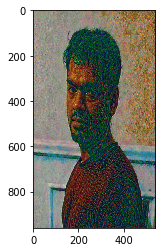

Total loss:  231414.625


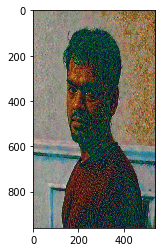

Total loss:  215881.1875


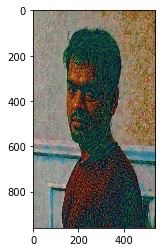

Total loss:  204907.71875


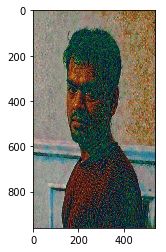

Total loss:  197004.484375


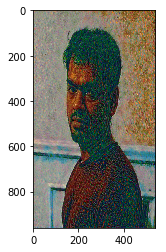

Total loss:  187528.03125


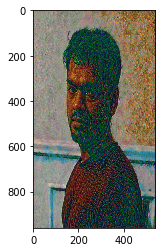

Total loss:  182593.40625


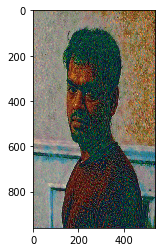

Total loss:  174492.109375


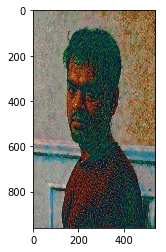

Total loss:  167290.609375


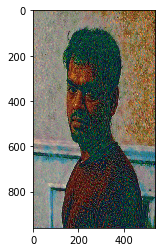

Total loss:  162053.78125


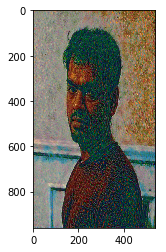

In [35]:
target_bg = train(target_bg, content_features, style_features, style_grams, style_weights, content_weight, style_weight)

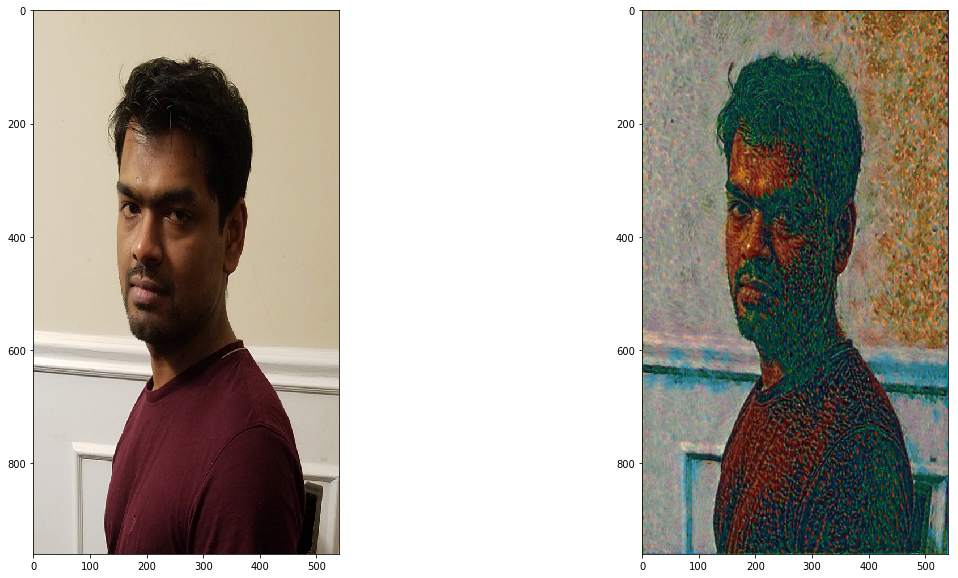

In [36]:
# display content and final, target image
#After 4000 steps
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 10))
ax1.imshow(im_convert(content_portrait))
ax2.imshow(im_convert(target_bg))

The background looks as dramatic as the original portrait..nice

In [37]:
plt.imsave('ramesh_bg_st.png', im_convert(target_bg))

---
## Transferring style for the portrait


In [27]:
target_portrait = content_portrait.clone().requires_grad_(True).to(device)

In [26]:
# weights for each style layer 
# weighting earlier layers less will result in fine-grained style artifacts
# notice we are excluding `conv4_2` our content representation
style_weights = {'conv1_1': 0.2,
                 'conv2_1': 0.2,
                 'conv3_1': 0.2,
                 'conv4_1': 0.75,
                 'conv5_1': 0.1}

content_weight = 1  # alpha
style_weight = 1e6  # beta #we want the style to be transferred but not at the risk of making the portrait obscure 

Total loss:  1599396.25


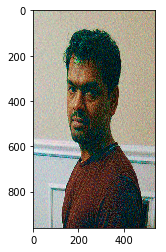

Total loss:  1136873.75


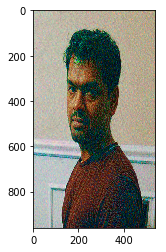

Total loss:  883343.875


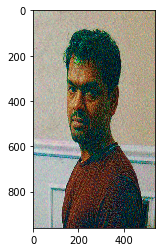

Total loss:  733990.3125


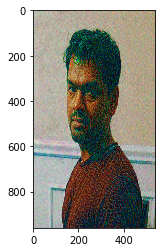

Total loss:  637741.125


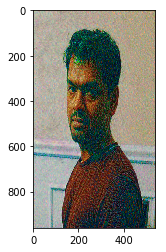

Total loss:  573999.9375


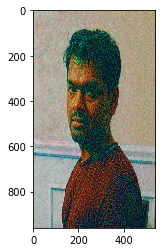

Total loss:  527152.625


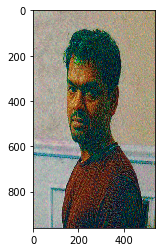

Total loss:  492131.65625


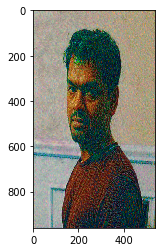

Total loss:  463335.65625


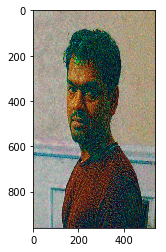

Total loss:  439755.9375


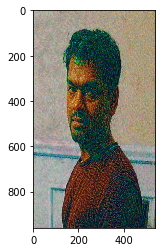

In [30]:
target_portrait = train(target_portrait, content_features, style_features, style_grams, style_weights, content_weight, style_weight)

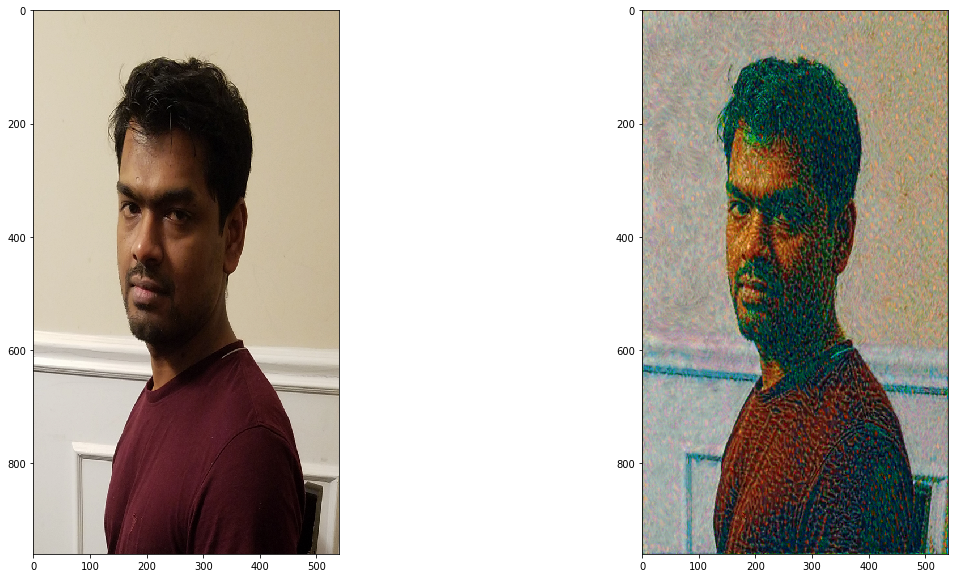

In [31]:
# display content and final, target image
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 10))
ax1.imshow(im_convert(content_portrait))
ax2.imshow(im_convert(target_portrait))

Not quite there yet! That god awful green tinge makes it worse.
Things may get better if we use just the face for style transfer 

---
## Using a different Van gogh portrait 


In [35]:
target_bg = content_portrait.clone().requires_grad_(True).to(device)

In [36]:
# weights for each style layer 
# weighting earlier layers less will result in fine-grained style artifacts
# notice we are excluding `conv4_2` our content representation
style_weights = {'conv1_1': 0.2,
                 'conv2_1': 0.2,
                 'conv3_1': 0.2,
                 'conv4_1': 0.75,
                 'conv5_1': 0.1}

content_weight = 1  # alpha
style_weight = 1e6  # beta #we want the style to be transferred but not at the risk of making the portrait obscure 

In [37]:
target_bg = train(target_bg, content_features, style_features, style_grams, style_weights, content_weight, style_weight)

KeyboardInterrupt: 

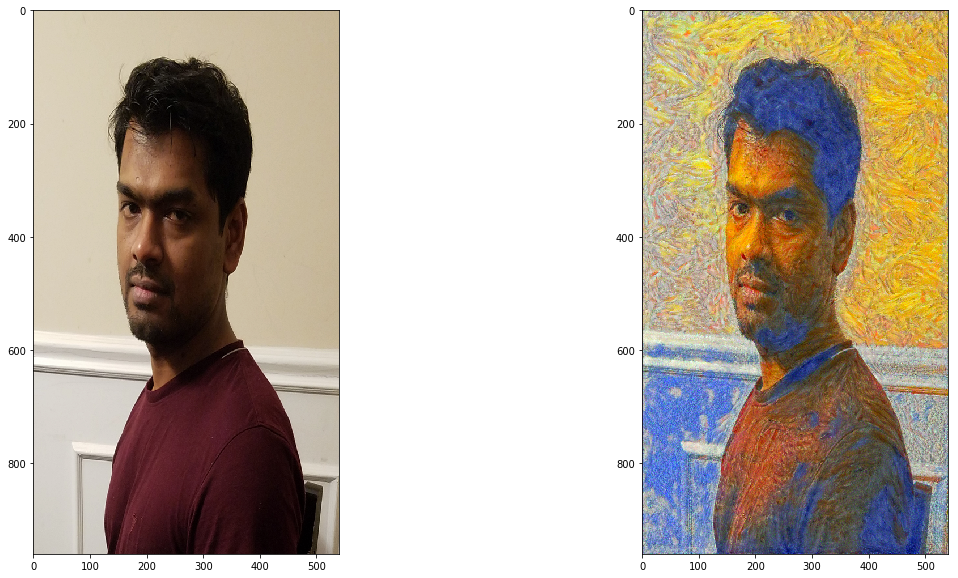

In [25]:
# display content and final, target image
#After 4000 steps
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 10))
ax1.imshow(im_convert(content_portrait))
ax2.imshow(im_convert(target_bg))

Those saturation artifacts(the blue) are ruining it ..also the red strokes on the face makes it look like he had Rosasea

# Trying Something different 

In [38]:
content_portrait.shape

torch.Size([1, 3, 960, 540])

In [13]:
#Gaussian initialization of target image 
#mu, sigma = 0, 0.1 # mean and standard deviation
#target_bg1 = np.random.normal(mu, sigma, image.size[0]*image.size[1]*3)
#target_bg1 = target_bg1.reshape(content_portrait.shape)
#target_bg1 = torch.from_numpy(target_bg1)

In [14]:
#target_bg1.shape

torch.Size([1, 3, 960, 540])

In [39]:
#target_bg = target_bg1.clone().requires_grad_(True).to(device)
target_bg = content_portrait.clone().requires_grad_(True).to(device)
#target_bg = torch.DoubleTensor(torch.from_numpy(np.random.normal(mu, sigma, image.size[0]*image.size[1]*3).reshape(content_portrait.shape)))

In [40]:
# weights for each style layer 
# weighting earlier layers more will result in *larger* style artifacts
# notice we are excluding `conv4_2` our content representation
style_weights = {'conv1_1': 1.,
                 'conv2_1': 0.75,
                 'conv3_1': 0.2,
                 'conv4_1': 0.2,
                 'conv5_1': 0.2}

content_weight = 1  # alpha
style_weight = 1  # beta #we want the style to be transferred as much as possible, we dont care about content this time

Total loss:  1.9265286922454834


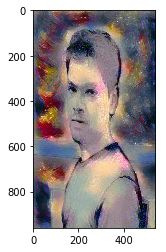

Total loss:  1.7382984161376953


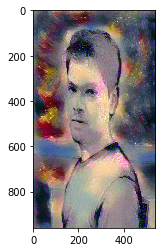

Total loss:  1.6053595542907715


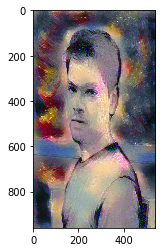

Total loss:  1.519742727279663


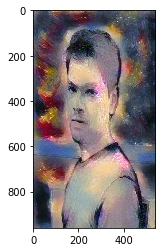

Total loss:  1.462265968322754


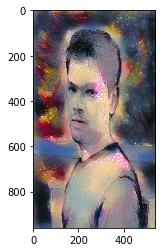

Total loss:  1.4217195510864258


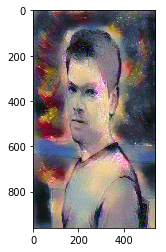

Total loss:  1.3924100399017334


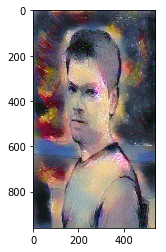

Total loss:  1.3694285154342651


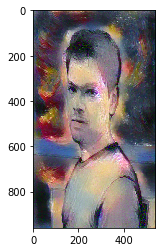

Total loss:  1.351441740989685


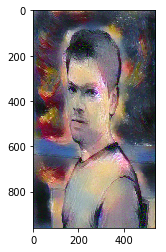

Total loss:  1.3370015621185303


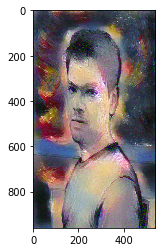

In [46]:
target_bg = train(target_bg, content_features, style_features, style_grams, style_weights, content_weight, style_weight)

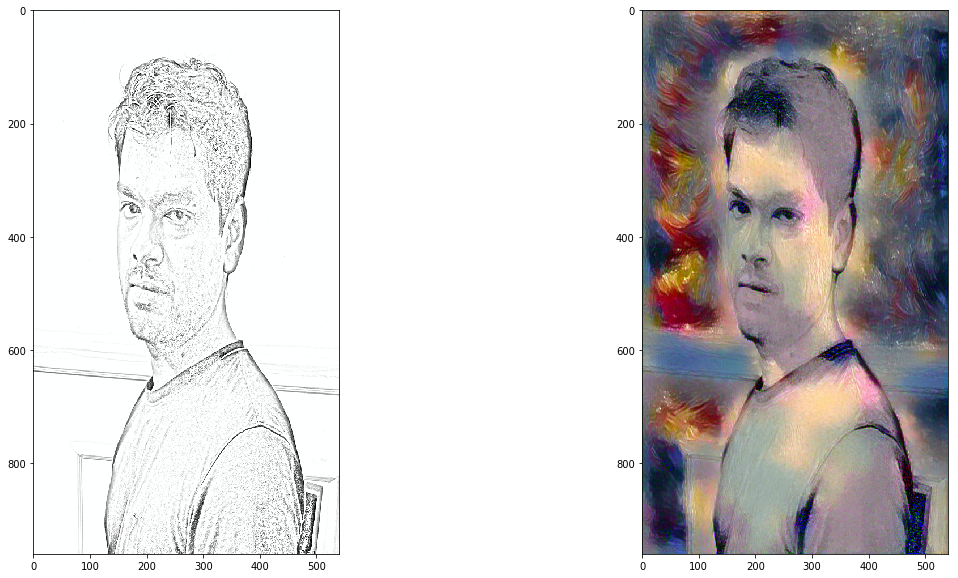

In [44]:
# display content and final, target image
#After 4000 steps
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 10))
ax1.imshow(im_convert(content_portrait))
ax2.imshow(im_convert(target_bg)) #backgrouns looks alright ..face alone needs more work to make him look less like Valak

In [ ]:
plt.imsave('ramesh_new_st.png', im_convert(target_bg))

In [54]:
# weights for each style layer 
# weighting earlier layers less will result in fine-grained style artifacts
# notice we are excluding `conv4_2` our content representation
style_weights = {'conv1_1': 0.2,
                 'conv2_1': 0.2,
                 'conv3_1': 0.2,
                 'conv4_1': 0.75,
                 'conv5_1': 0.1}

content_weight = 1  # alpha
style_weight = 1e6  # beta #we want the style to be transferred but not at the risk of making the portrait obscure 

Now we are working on getting the face part right

Total loss:  11761.466796875


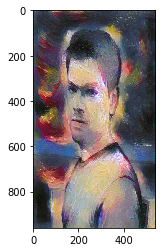

Total loss:  11335.427734375


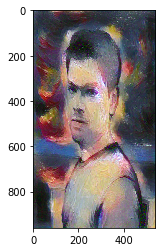

Total loss:  11165.6865234375


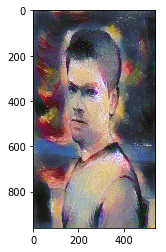

Total loss:  11238.6953125


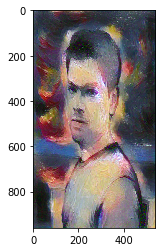

Total loss:  11336.037109375


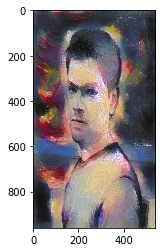

Total loss:  10831.4091796875


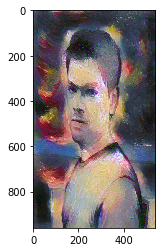

Total loss:  11643.3623046875


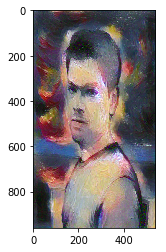

Total loss:  10676.6279296875


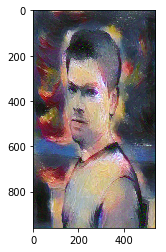

Total loss:  11057.6181640625


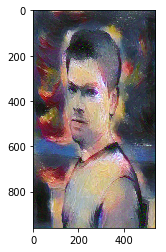

Total loss:  10551.142578125


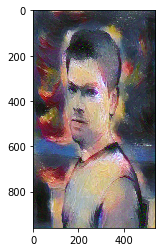

In [59]:
target_bg = train(target_bg, content_features, style_features, style_grams, style_weights, content_weight, style_weight)

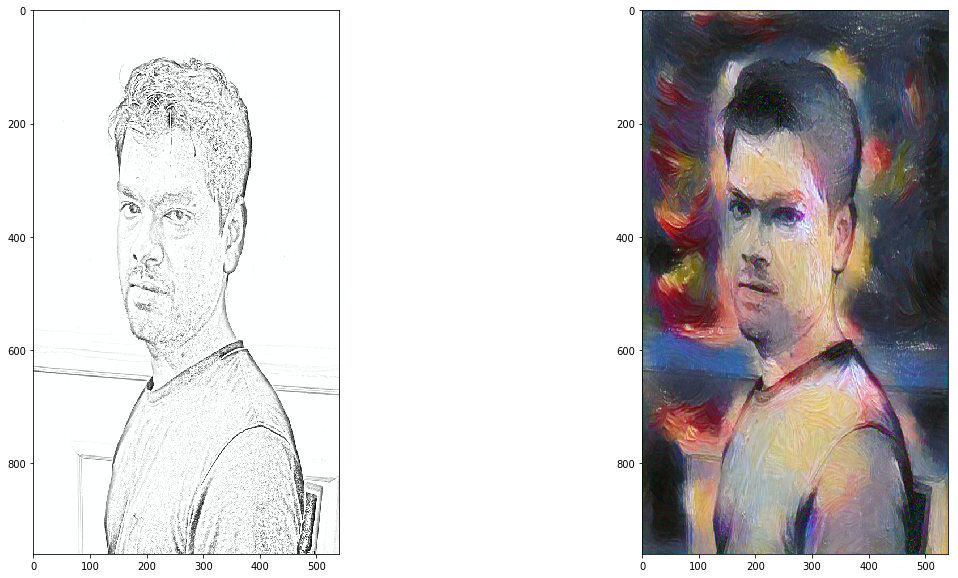

In [60]:
# display content and final, target image
#After 4000 steps
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 10))
ax1.imshow(im_convert(content_portrait))
ax2.imshow(im_convert(target_bg)) 

In [51]:
plt.imsave('ramesh_face.png', im_convert(target_bg))

In [63]:
target_bg = content_portrait.clone().requires_grad_(True).to(device)

Total loss:  2.4106171131134033


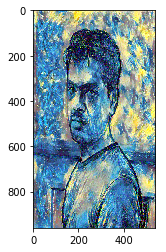

Total loss:  2.3923239707946777


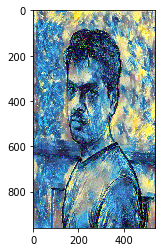

Total loss:  2.3709094524383545


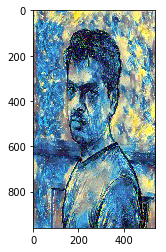

Total loss:  2.3482789993286133


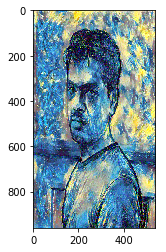

Total loss:  2.3259735107421875


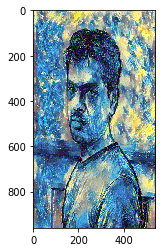

Total loss:  2.3039145469665527


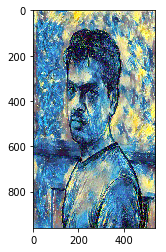

Total loss:  2.2843024730682373


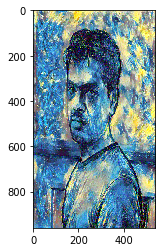

Total loss:  2.2640507221221924


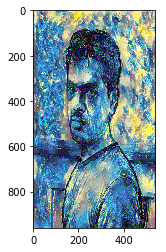

Total loss:  2.246847152709961


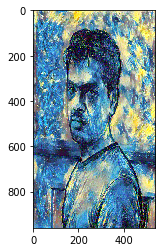

Total loss:  2.2308292388916016


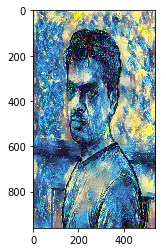

In [70]:
# weights for each style layer 
# weighting earlier layers more will result in *larger* style artifacts
# notice we are excluding `conv4_2` our content representation
style_weights = {'conv1_1': 1.,
                 'conv2_1': 0.75,
                 'conv3_1': 0.2,
                 'conv4_1': 0.2,
                 'conv5_1': 0.2}

content_weight = 1  # alpha
style_weight = 1  # beta #we want the style to be transferred as much as possible, we dont care about content this time
target_bg = train(target_bg, content_features, style_features, style_grams, style_weights, content_weight, style_weight)

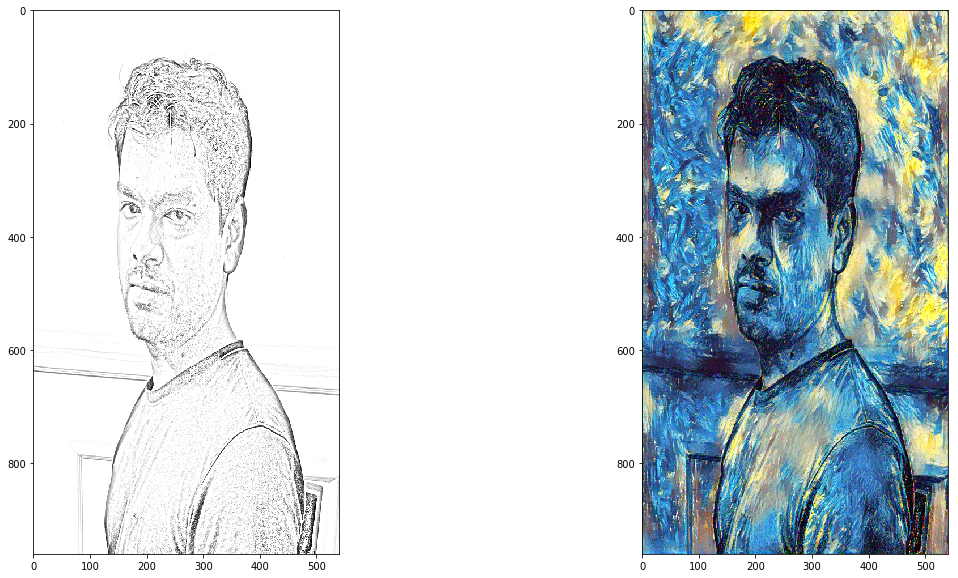

In [72]:
# display content and final, target image
#After 4000 steps
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 10))
ax1.imshow(im_convert(content_portrait))
ax2.imshow(im_convert(target_bg)) 

In [73]:
plt.imsave('ramesh_bg1.png', im_convert(target_bg))

# Apply segmentation mask

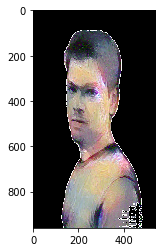

In [88]:
import skimage.morphology

img_not_preprocessed = Image.open('ramesh_face.png').convert('RGB')

image_np = np.asarray(img_not_preprocessed)

prediction_mask = np.load('prediction_mask.npy')
# Let's apply some morphological operations to
# create the contour for our sticker

cropped_object = image_np * np.dstack((prediction_mask,) * 3)

square = skimage.morphology.square(5)

temp = skimage.morphology.binary_erosion(prediction_mask, square)

negative_mask = (temp != True)

eroding_countour = negative_mask * prediction_mask

eroding_countour_img = np.dstack((eroding_countour, ) * 3)

cropped_object_no_contour = cropped_object.copy()

cropped_object[eroding_countour_img] = 248

png_transparancy_mask = np.uint8(prediction_mask * 255)

image_shape = cropped_object.shape

png_array = np.zeros(shape=[image_shape[0], image_shape[1], 4], dtype=np.uint8)
png_array[:, :, :3] = cropped_object
png_array[:, :, 3] = png_transparancy_mask

png_array_1 = np.zeros(shape=[image_shape[0], image_shape[1], 4], dtype=np.uint8)
png_array_1[:, :, :3] = cropped_object_no_contour
png_array_1[:, :, 3] = png_transparancy_mask

plt.imshow(cropped_object)

In [81]:
layer1 = Image.open("ramesh_bg1.png")
layer1.size

(540, 960)

In [91]:
plt.imsave('sticker_no_contour.png', png_array_1)
layer2 = Image.open("sticker_no_contour.png")

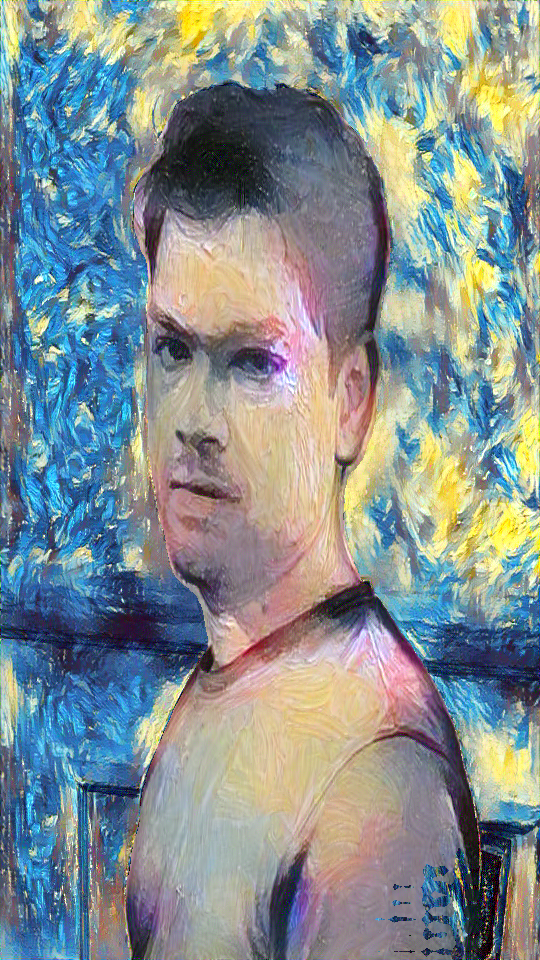

In [93]:
final1 = Image.new("RGBA", layer1.size)
final1.paste(layer1)
final1.paste(layer2, (0,0), layer2)

final1

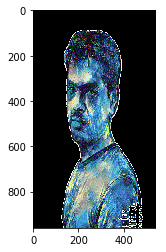

In [94]:
img_not_preprocessed = Image.open('ramesh_bg1.png').convert('RGB')

image_np = np.asarray(img_not_preprocessed)

prediction_mask = np.load('prediction_mask.npy')
# Let's apply some morphological operations to
# create the contour for our sticker

cropped_object = image_np * np.dstack((prediction_mask,) * 3)

square = skimage.morphology.square(5)

temp = skimage.morphology.binary_erosion(prediction_mask, square)

negative_mask = (temp != True)

eroding_countour = negative_mask * prediction_mask

eroding_countour_img = np.dstack((eroding_countour, ) * 3)

cropped_object_no_contour = cropped_object.copy()

cropped_object[eroding_countour_img] = 248

png_transparancy_mask = np.uint8(prediction_mask * 255)

image_shape = cropped_object.shape

png_array = np.zeros(shape=[image_shape[0], image_shape[1], 4], dtype=np.uint8)
png_array[:, :, :3] = cropped_object
png_array[:, :, 3] = png_transparancy_mask

png_array_1 = np.zeros(shape=[image_shape[0], image_shape[1], 4], dtype=np.uint8)
png_array_1[:, :, :3] = cropped_object_no_contour
png_array_1[:, :, 3] = png_transparancy_mask

plt.imshow(cropped_object)

In [95]:
layer1 = Image.open("ramesh_new_st.png")
layer1.size

(540, 960)

In [96]:
plt.imsave('sticker_no_contour.png', png_array_1)
layer2 = Image.open("sticker_no_contour.png")

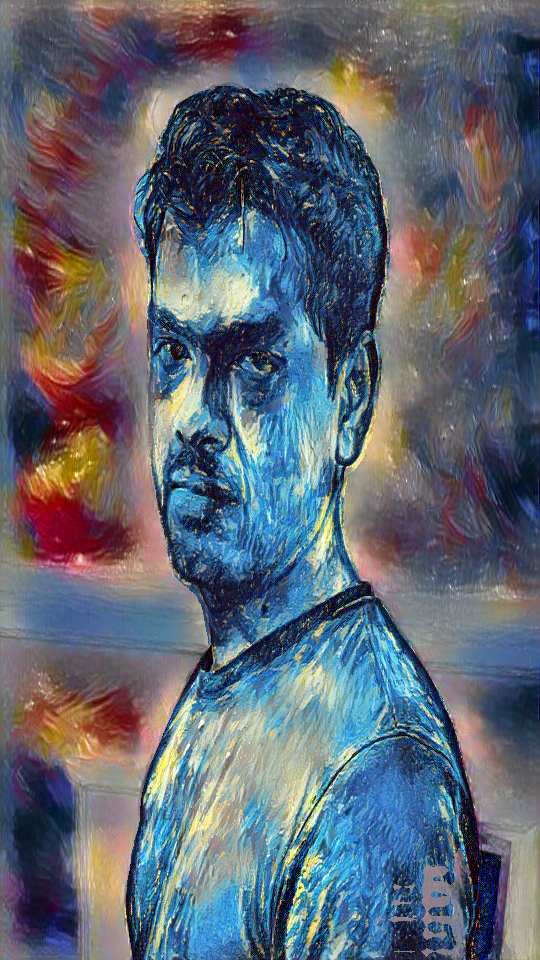

In [97]:
final1 = Image.new("RGBA", layer1.size)
final1.paste(layer1)
final1.paste(layer2, (0,0), layer2)

final1